# Main questions

## Data Augmentation

I want to augment the sound files in the training data by adding noise, but I don't necessarily want to modify the test files. On one hand, it would be easiest to include adding the noise in the audio file processing pipeline, since I want to segment each original audio file, then add noise to each segment. However, I don't necessarily want this pipeline to apply to the test file, since I don't need to add noise.

The other option is to take the original file, copy it and add noise, then segment both files. The open question here is whether the segmentation will be the same in both of the files. Given what I know about the segmentation algorithm, I suspect that the segmentation will be different, since the noise will influence where the algorithm finds "silence".

I need to look more at the segmentation algorithm and its parameters, but the documentation isn't very clear.

## Model Input
I need to look at the vggish model documentation to see what kind of input the model takes. I think in takes a mel spectrogram of dimensiones (128, 96). I know that when I extract the mel spectrogram from my segmented audio files, the first dimension is 128, but the second varies. I need to make sure that I am processing all of my files in a way that is compatible with the model.

Also, the model may have a preprocessing routine that would generate the correct input. While I may end up using  this preprocessing routine, I would like to be able to do it by myself, to have a deeper understanding of how the audio files are being processed and transformed.

In [2]:
# Set up the environment
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
import IPython.display as ipd
import librosa
import librosa.display

from pyAudioAnalysis import audioSegmentation as aS

import os
import random

/opt/anaconda3/lib/python3.7/site-packages/pydub/utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


## Load a (limited) set of sound files to examine

In [3]:
filenames = ["agni1.mp3", "mandarin3.mp3", "spanish94.mp3", 
             "french38.mp3", "lao2.mp3"]
SAMP_RATE = 16000

In [4]:
agni = filenames[0]
mandarin = filenames[1]
spanish = filenames[2]
french = filenames[3]
lao = filenames[4]

## For each sample file
- Load a sound file
- Run the segmentation algorithm and plot results
- Add noise to the sound file
- Run the segmentation algorithm on the noisy file

In [14]:
def add_noise(audio, weight):
    rng = np.random.default_rng()
    noise = rng.standard_normal(len(audio))
    noisy = audio + (noise * weight)
    return noisy

## Agni audio sample

In [6]:
ipd.Audio(agni)

/opt/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:162: UserWarning:

PySoundFile failed. Trying audioread instead.



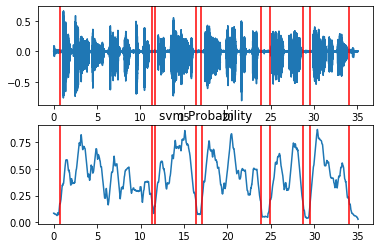

In [8]:
# https://github.com/tyiannak/pyAudioAnalysis/wiki/5.-Segmentation
agni_audio, sr = librosa.load(agni, sr=SAMP_RATE)
# segments is a list of endpoints
agni_seg = aS.silence_removal(agni_audio, SAMP_RATE, 0.020, 0.020, smooth_window = 1.0, weight = 0.15, plot = True)

In [16]:
agni_noise = add_noise(agni_audio, 0.015)

ipd.Audio(agni_noise, rate=SAMP_RATE)

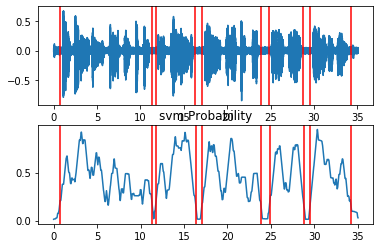

In [17]:
agni_noise_seg = aS.silence_removal(agni_noise, SAMP_RATE, 0.020, 0.020, smooth_window = 1.0, weight = 0.15, plot = True)

### Agni comments
Adding noise to the Agni audio doesn't seem to change the segmentation algorithm. The level of noise added here was weighted to 0.015. I will try different weights in some of the remaining files, to see how the weight of the noise affects the sound files and the segmentation.

## Mandarin audio sample

In [18]:
ipd.Audio(mandarin)

/opt/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:162: UserWarning:

PySoundFile failed. Trying audioread instead.



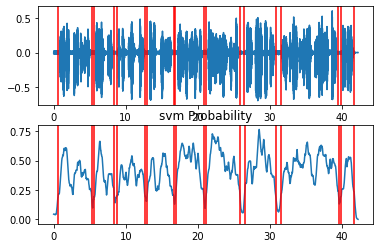

In [19]:
mandarin_audio, sr = librosa.load(mandarin, sr=SAMP_RATE)
# segments is a list of endpoints
mandarin_seg = aS.silence_removal(mandarin_audio, SAMP_RATE, 0.020, 0.020, smooth_window = 1.0, weight = 0.15, plot = True)

In [43]:
mandarin_noise = add_noise(mandarin_audio, 0.01)

ipd.Audio(mandarin_noise, rate=SAMP_RATE)

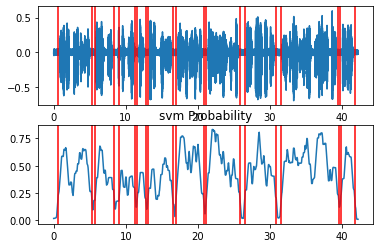

In [44]:
mandarin_noise_seg = aS.silence_removal(mandarin_noise, SAMP_RATE, 0.020, 0.020, smooth_window = 1.0, weight = 0.15, plot = True)

### Mandarin comments
The Mandarin speakers has several pauses and breaks in the original sound file, which are taken as segmentation breaksm and results in the original file being chopped into short segments. Running the segmentation algorithm on the noisy file increased the number of small segments by one. Neither of the segmentation methods seems ideal - there are too many short segments.

The weight of the noise in this sample is 0.01 (down from 0.015 in the Agni file).

## Spanish audio sample

In [22]:
ipd.Audio(spanish)

/opt/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:162: UserWarning:

PySoundFile failed. Trying audioread instead.



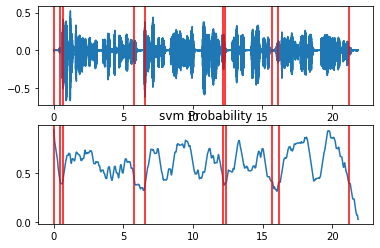

In [23]:
spanish_audio, sr = librosa.load(spanish, sr=SAMP_RATE)
# segments is a list of endpoints
spanish_seg = aS.silence_removal(spanish_audio, SAMP_RATE, 0.020, 0.020, smooth_window = 1.0, weight = 0.15, plot = True)

In [26]:
spanish_noise = add_noise(spanish_audio, 0.005)

ipd.Audio(spanish_noise, rate=SAMP_RATE)

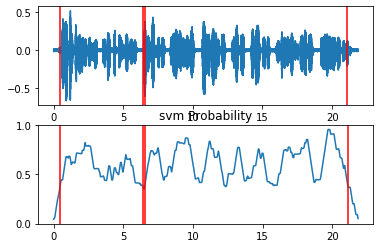

In [27]:
spanish_noise_seg = aS.silence_removal(spanish_noise, SAMP_RATE, 0.020, 0.020, smooth_window = 1.0, weight = 0.15, plot = True)

### Spanish comments

The weight of the noise in this file is 0.005, the lowest so far. This weight was suggested/used by the tutorial at (website/tutorial), but seemed pretty low to me.

This resulted in the file being segmented into only two parts, which suggests that the original segmentation, with 4/5 segments,  is more in line with the desired resuls.

Running the analysis again with a greater noise weight (see below) results in only two segments, but they are different segements than the file with less noise.

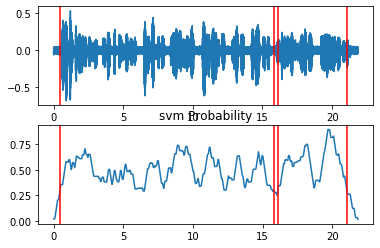

In [28]:
spanish_noise = add_noise(spanish_audio, 0.015)
spanish_noise_seg = aS.silence_removal(spanish_noise, SAMP_RATE, 0.020, 0.020, smooth_window = 1.0, weight = 0.15, plot = True)

## French audio sample

In [29]:
ipd.Audio(french)

/opt/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:162: UserWarning:

PySoundFile failed. Trying audioread instead.



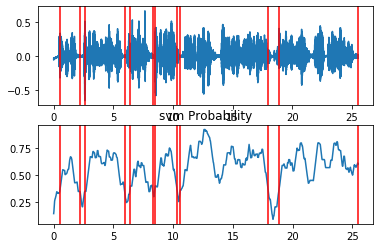

In [30]:
french_audio, sr = librosa.load(french, sr=SAMP_RATE)
# segments is a list of endpoints
french_seg = aS.silence_removal(french_audio, SAMP_RATE, 0.020, 0.020, smooth_window = 1.0, weight = 0.15, plot = True)

In [35]:
french_noise = add_noise(french_audio, 0.005)

ipd.Audio(french_noise, rate=SAMP_RATE)

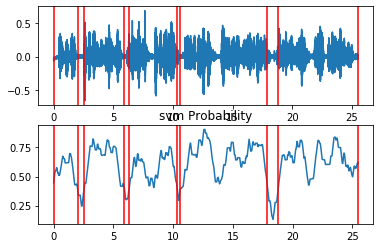

In [36]:
french_noise_seg = aS.silence_removal(french_noise, SAMP_RATE, 0.020, 0.020, smooth_window = 1.0, weight = 0.15, plot = True)

### French comments
First run with the lower noise weight (0.005) to see how it compares with the Spanish sample with equally low weight. The noisy  file has one less segment than the original file, resulting from the combination of two very short segments. This segmentation seems reasonable given the pauses in the file, and the underlying sentence structure.

I accidentally set the noise weight to 0.05. The result is more segments than the original, which is probably too many segments. It is also a very noisy fiile, and relatively hard to hear the speaker over the noise.

## Lao audio sample
There is a lot of background noise in the original file without adding any noise.
This speaker hesitates quite a bit, and the production is not particularly fluent.

In [37]:
ipd.Audio(lao)

/opt/anaconda3/lib/python3.7/site-packages/librosa/core/audio.py:162: UserWarning:

PySoundFile failed. Trying audioread instead.



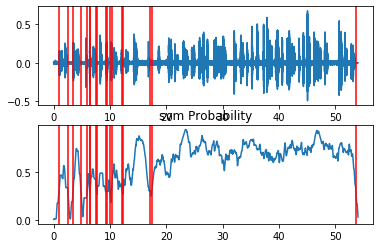

In [38]:
lao_audio, sr = librosa.load(lao, sr=SAMP_RATE)
# segments is a list of endpoints
lao_seg = aS.silence_removal(lao_audio, SAMP_RATE, 0.020, 0.020, smooth_window = 1.0, weight = 0.15, plot = True)

In [41]:
lao_noise = add_noise(lao_audio, 0.015)

ipd.Audio(lao_noise, rate=SAMP_RATE)

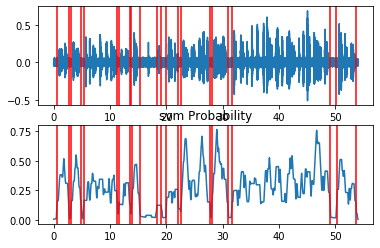

In [42]:
lao_noise_seg = aS.silence_removal(lao_noise, SAMP_RATE, 0.020, 0.020, smooth_window = 1.0, weight = 0.15, plot = True)

###  Lao comments
There is a lot of background noise in the original sound file. Adding artificial noise doesn't completely drown out the original background noise, but does spread out the segmentation a bit. However, both the orginal segmentation and the noisy segmentation produce really small segments, and neither capture the expected breaks iin the underlying text.

I tried noise weights of 0.01 and 0.015, and both had similar results.

## Thoughts on segmentation
- I wonder if there is a way to specify the resulting number of segments. Ideally, I would like each file to be broken down into 4 segments. I haven't found a way to specify the number of segments yet.
- It might be possible to specify the length of the resulting segmentation - if not from the segmentation function, then using the list that results from the function. In this way, multiple short segments could be combined into larger segments. 4 or 5 seconds seems to be a reasonable length of a segment, though there are some 2s segments that seem reasonable too ("Please call Stella", the first sentence, takes less than 2s for most speakers.)
- I haven't listened to the individual segments to make sure that they capture entire phrases/words. I know from a previous implementatation of the segementation algorithm that sometime a word-initial vowel is not captured when they segments are extracted. Checking this will require loading and listening to each segment separately.

In [49]:
# Listen to the individual segments of the Spanish audio segmentation
print(spanish_seg)
ipd.Audio(spanish_audio[int(spanish_seg[0][0]*SAMP_RATE):int(spanish_seg[0][1]*SAMP_RATE)], rate=SAMP_RATE)

[[0.0, 0.46], [0.64, 5.8], [6.58, 12.18], [12.34, 15.700000000000001], [16.14, 21.18]]


This first segment contains no speech, just background noise. It should probably be deleted, or combined with the next segment. Notice is it less than 1 second long, so it could be combined with another segment, if I can figure out how to make that work.

In [50]:
ipd.Audio(spanish_audio[int(spanish_seg[1][0]*SAMP_RATE):int(spanish_seg[1][1]*SAMP_RATE)], rate=SAMP_RATE)

Notice the final -s of "peas" gets cut off.

In [51]:
ipd.Audio(spanish_audio[int(spanish_seg[2][0]*SAMP_RATE):int(spanish_seg[2][1]*SAMP_RATE)], rate=SAMP_RATE)

Both the beginning and ending of this segment are cut off. It may not be a big deal in a longer segment, but I hate to see any of the speech lost.

In [52]:
ipd.Audio(spanish_audio[int(spanish_seg[3][0]*SAMP_RATE):int(spanish_seg[3][1]*SAMP_RATE)], rate=SAMP_RATE)

This short segment remains intact - I don't think anything is missing

In [53]:
ipd.Audio(spanish_audio[int(spanish_seg[4][0]*SAMP_RATE):int(spanish_seg[4][1]*SAMP_RATE)], rate=SAMP_RATE)

Again, the beginning and ending of this segment are cut off.

## VGGish notes
features - np array of shape [batch_size, num_frames, num_bands]
each row is a log mel spectrogram patch of shape [num_frames, num_bands] suitable for feeding VGGish

label - np array of shape [batch_size, num_classes] - each row is a multi-hot label vector


Architecture - variant of BGG model, Configuration A with 11 weight layers
- input size is 86x64 for log mel spctrogram
- drop last group of convo and maxpool layers - 4 groups of layers, not 5
- use 128-wide fully connected layer at end, instead of 1000
- final embedding layer doesn't include non-linear activiatiion, so add one before you add more layers

Audio input features
- audio resampled to 16kHz mono [done]
- compute spectrogram using STFT - window_size-25ms, window_hop=10ms, periodice Hann window
- mel spectrogram by mapping psectrogram to 64 mel bins for range 125-7500 Hz
- compute stabalized log mel spectrogram by applying log(mel-spectrum + 0.01) (offset to avoid taking log of zero)
- features framed into non-overlapping examples of 0.96s, where each covers 64 mel bands and 96 frames of 10 ms each

96 frames, 64 bands, 128 size of embedding layer
16K sample rate
min hz = 125, max hz = 7500

AudioSet audio has 10s clips, so to get 96 non-overlapping frames, each frame is 0.96s.
- Do I need to recalcluate the number of frames, or use 10s audio clips?
- I'm not sure it is possible to change these features in the VGGish model - they are set constant hyperparameters
- I know it is possible to segment my files into 10s clips using the same segmentation algorithm. Maybe I should try that first?

Reference material

VGGish documentation on GitHub:
https://github.com/tensorflow/models/tree/master/research/audioset/vggish

VGGish notebook sample/tutorial on Colab:
https://colab.research.google.com/drive/1TbX92UL9sYWbdwdGE0rJ9owmezB-Rl1C
    
Cite article if you use the pre-trained model:    
Hershey, S. et. al., CNN Architectures for Large-Scale Audio Classification, ICASSP 2017    